In [2]:
import numpy as np
from numpy import loadtxt
import pandas as pd
import time
import matplotlib
import matplotlib.pyplot as plt
import pyvisa as visa
from matplotlib import animation
from time import sleep
from matplotlib.animation import FuncAnimation
#Importing the functions from the module and the pulses dictionaries
from Sweeping import *
from Dictionaries import *
from PulseFiles import *
from Instrument import *
import pyqtgraph as pg 
import nidaqmx
import pickle

In [5]:
AWG_Settings= {
    'Visa Resource Name': 'TCPIP0::ibn3-036.ibn-net.kfa-juelich.de::hislip0::INSTR',
    'Voltage Amplitude':700,
    'Clock Sample Frecuency':6000000000,
    'Output_Channel': 1,
    'Mode': 'STS',
    'Trigger In Threshold' : 1,
    'Output Rout': 'DAC', #DAC output rout only has the BNC outputs: Direct Out and (Averaged) Direct Out
    'Data Directory': r'D:\Alejandro\Pulses\diode measurements\Pulse Scheme CSV\Measurements\1000nano'
}

In [6]:
M8190A = VisaR(AWG_Settings,60000)

In [ ]:
Initialization(M8190A,AWG_Settings)

In [30]:
M8190A.write('SEQ:DEL:ALL')

12

# 1ms

In [8]:
sweeping_run_1ms_a = pickle.load(open("sweepingA_30steps_5ms.p", "rb"))
sweeping_run_1ms_b = pickle.load(open("sweepingB_30steps_5ms.p", "rb"))

<ipython-input-8-645809dc7552>:1: ResourceWarning: unclosed file <_io.BufferedReader name='sweepingA_30steps_5ms.p'>
  sweeping_run_1ms_a = pickle.load(open("sweepingA_30steps_5ms.p", "rb"))
<ipython-input-8-645809dc7552>:2: ResourceWarning: unclosed file <_io.BufferedReader name='sweepingB_30steps_5ms.p'>
  sweeping_run_1ms_b = pickle.load(open("sweepingB_30steps_5ms.p", "rb"))


In [31]:
Diode_Signal_1ms = Sequence_Loader_File_DAQ_np(M8190A,DAQ_Settings1,1000,30,sweeping_run_1ms_a,sweeping_run_1ms_b)

Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 0
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 1
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 2
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 3
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 4
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse 

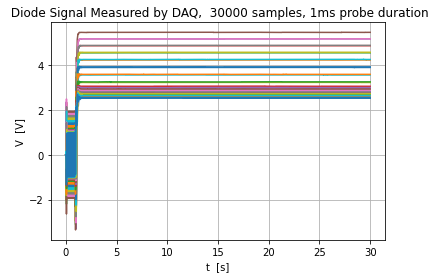

In [32]:
location1ms_steps = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\1ms\Sweeping steps'
location1ms = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\1ms'

fig,ax= plt.subplots()
ax.grid(True)
for i in range(0,len(Diode_Signal_1ms)):
    plt.plot(Diode_Signal_1ms[i][1],Diode_Signal_1ms[i][0],label= 'Step {st}'.format(st = i ))

ax.set_ylabel(r'V  [V]')
ax.set_xlabel('t  [s]')
ax.set_title(r' Diode Signal Measured by DAQ,  {b} samples, 1ms probe duration'.format(b = len(Diode_Signal_1ms[0][1]) ))
#ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
#ax.legend(loc=0)
plt.show()
fig.savefig(r'{loc}\Diode Signal time cstant = 10ms sensitivity 500microV,30seconds, 5ms scheme, probe duration 1ms,31 steps, no legend .jpeg'.format(loc = location1ms),bbox_inches='tight')

In [33]:
for i in range(0,len(Diode_Signal_1ms)):
    np.savetxt(r'{loc}\diode_signal_step{stp}_30sdaqtime_5ms_tc10ms.csv'.format(loc = location1ms_steps ,stp = i), Diode_Signal_1ms[i][0], delimiter=',') 

chopped_measurement_data = np.zeros((len(Diode_Signal_1ms)),  dtype=object)
for i in range(0,len(Diode_Signal_1ms)):
    chopped_measurement_data[i] = Diode_Signal_1ms[i][0][3500:] 

avr_1ms = np.array([np.average(i) for i in chopped_measurement_data])
np.savetxt(r'{loc}\averaged signal_31steps_30sdaqtime_tc10ms.csv'.format(loc =location1ms),avr_1ms,delimiter=',')

In [34]:
time_delay = np.linspace(-2,2,31)

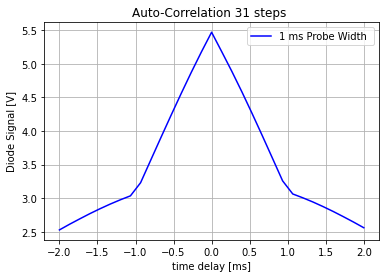

In [36]:
#change this to V regime
fig,axes = plt.subplots()

axes.grid(True)

plt.plot(time_delay,avr,label=r'1 ms Probe Width ',color='blue')

axes.set_xlabel(r'time delay [ms]')
axes.set_ylabel(r'Diode Signal [V]')
axes.set_title('Auto-Correlation 31 steps ')

axes.legend(loc = 0)
plt.show()

fig.savefig(r'{loc}\Autocorrelation function 31 steps 1ms probe, tc =10ms,sens = 500microV, 30s daq time.jpeg'.format(loc = location1ms),bbox_inches='tight')

In [ ]:
M8190A.write('')

# 100 micro

In [37]:
sweeping_run_100micro_a = pickle.load(open(r"{dict}\cycleA_30steps_5ms_100micro_probe.p".format(dict =r'D:\Alejandro\Pulses\diode measurements\TList\100micro'), "rb"))
sweeping_run_100micro_b = pickle.load(open("sweepingB_30steps_5ms_10micro_probe.p", "rb"))

<ipython-input-37-c7e4d90be258>:1: ResourceWarning: unclosed file <_io.BufferedReader name='D:\\Alejandro\\Pulses\\diode measurements\\TList\\100micro\\cycleA_30steps_5ms_100micro_probe.p'>
  sweeping_run_100micro_a = pickle.load(open(r"{dict}\cycleA_30steps_5ms_100micro_probe.p".format(dict =r'D:\Alejandro\Pulses\diode measurements\TList\100micro'), "rb"))
<ipython-input-37-c7e4d90be258>:2: ResourceWarning: unclosed file <_io.BufferedReader name='sweepingB_30steps_5ms_10micro_probe.p'>
  sweeping_run_100micro_b = pickle.load(open("sweepingB_30steps_5ms_10micro_probe.p", "rb"))


In [43]:
Diode_Signal_100micro = Sequence_Loader_File_DAQ_np(M8190A,DAQ_Settings1,1000,30,sweeping_run_100micro_a,sweeping_run_100micro_b)

Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 0
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 1
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 2
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 3
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 4
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse 

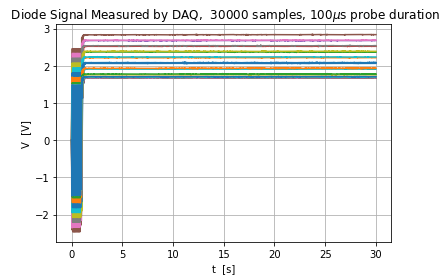

In [45]:
location_steps = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\100micro\Sweeping steps'
location = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\100micro'

fig,ax= plt.subplots()
ax.grid(True)
for i in range(0,len(Diode_Signal_100micro)):
    plt.plot(Diode_Signal_100micro[i][1],Diode_Signal_100micro[i][0],label= 'Step {st}'.format(st = i ))

ax.set_ylabel(r'V  [V]')
ax.set_xlabel('t  [s]')
ax.set_title(r' Diode Signal Measured by DAQ,  {b} samples, 100$\mu$s probe duration'.format(b = len(Diode_Signal_100micro[0][1]) ))
#ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
#ax.legend(loc=0)
plt.show()
fig.savefig(r'{loc}\Diode Signal time cstant = 3ms sensitivity 500microV, 5ms scheme, probe duration 100 micros,31 steps, no legend,30sdaq .jpeg'.format(loc = location),bbox_inches='tight')

In [46]:
for i in range(0,len(Diode_Signal_100micro)):
    np.savetxt(r'{loc}\diode_signal_step{stp}_30sdaqtime_5ms_tc3ms.csv'.format(loc = location_steps ,stp = i), Diode_Signal_100micro[i][0], delimiter=',') 

chopped_measurement_data = np.zeros((len(Diode_Signal_100micro)),  dtype=object)
for i in range(0,len(Diode_Signal_100micro)):
    chopped_measurement_data[i] = Diode_Signal_100micro[i][0][3500:] 

avr_100micro = np.array([np.average(i) for i in chopped_measurement_data])
np.savetxt(r'{loc}\averaged signal_31steps_20sdaqtime_tc3ms.csv'.format(loc =location),avr_100micro,delimiter=',')

In [59]:
location

'D:\\Alejandro\\Pulses\\All Diode Measurements Notebook\\10micro'

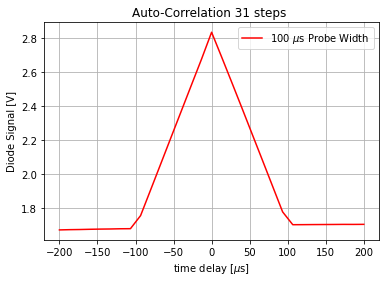

In [47]:
#change this to V regime
time_delay = np.linspace(-200,200,31)

fig,axes = plt.subplots()

axes.grid(True)

plt.plot(time_delay,avr_100micro,label=r'100 $\mu$s Probe Width ',color='red')

axes.set_xlabel(r'time delay [$\mu$s]')
axes.set_ylabel(r'Diode Signal [V]')
axes.set_title('Auto-Correlation 31 steps ')

axes.legend(loc = 0)
plt.show()

fig.savefig(r'{loc}\Autocorrelation function 31 steps, tc =3ms , sensitivity =500microV  ,100microsprobe,30seq daq.jpeg'.format(loc = location),bbox_inches='tight')

In [57]:
M8190A.write('SEQ:DEL:ALL')

12

# 10 micro

In [49]:
sweeping_run_10micro_a = pickle.load(open("sweepingA_30steps_5ms_10micro_probe.p", "rb"))
sweeping_run_10micro_b = pickle.load(open("sweepingB_30steps_5ms_10micro_probe.p", "rb"))

<ipython-input-49-982abbc897c7>:1: ResourceWarning: unclosed file <_io.BufferedReader name='sweepingA_30steps_5ms_10micro_probe.p'>
  sweeping_run_10micro_a = pickle.load(open("sweepingA_30steps_5ms_10micro_probe.p", "rb"))
<ipython-input-49-982abbc897c7>:2: ResourceWarning: unclosed file <_io.BufferedReader name='sweepingB_30steps_5ms_10micro_probe.p'>
  sweeping_run_10micro_b = pickle.load(open("sweepingB_30steps_5ms_10micro_probe.p", "rb"))


In [58]:
Diode_Signal_10micro = Sequence_Loader_File_DAQ_np(M8190A,DAQ_Settings1,1000,20,sweeping_run_10micro_a,sweeping_run_10micro_b)

Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 0
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 1
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 2
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 3
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 4
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse 

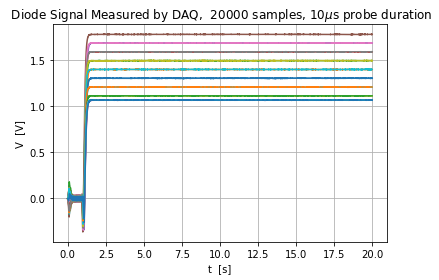

In [60]:
location_steps = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\10micro\Sweeping steps'
location = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\10micro'

fig,ax= plt.subplots()
ax.grid(True)
for i in range(0,len(Diode_Signal_10micro)):
    plt.plot(Diode_Signal_10micro[i][1],Diode_Signal_10micro[i][0],label= 'Step {st}'.format(st = i ))

ax.set_ylabel(r'V  [V]')
ax.set_xlabel('t  [s]')
ax.set_title(r' Diode Signal Measured by DAQ,  {b} samples, 10$\mu$s probe duration'.format(b = len(Diode_Signal_10micro[0][1]) ))
#ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
#ax.legend(loc=0)
plt.show()
fig.savefig(r'{loc}\Diode Signal time cstant = 30ms sensitivity 500microV,20secondsdaq, 5ms scheme, probe duration 10 micros,31 steps, no legend .jpeg'.format(loc = location),bbox_inches='tight')

In [61]:
for i in range(0,len(Diode_Signal_10micro)):
    np.savetxt(r'{loc}\diode_signal_step{stp}_20sdaqtime_5ms_tc30ms.csv'.format(loc = location_steps ,stp = i), Diode_Signal_10micro[i][0], delimiter=',') 

chopped_measurement_data = np.zeros((len(Diode_Signal_10micro)),  dtype=object)
for i in range(0,len(Diode_Signal_10micro)):
    chopped_measurement_data[i] = Diode_Signal_10micro[i][0][2500:] 



avr_10micro = np.array([np.average(i) for i in chopped_measurement_data])
np.savetxt(r'{loc}\averaged signal_31steps_20sdaqtime_tc30ms.csv'.format(loc =location),avr_10micro,delimiter=',')

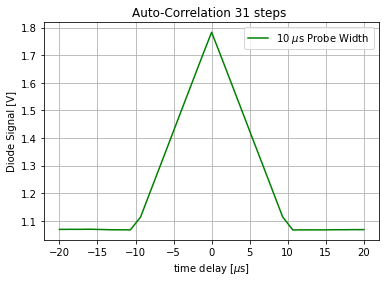

In [62]:
#change this to V regime
time_delay = np.linspace(-20,20,31)

fig,axes = plt.subplots()

axes.grid(True)

plt.plot(time_delay,avr_10micro,label=r'10 $\mu$s Probe Width ',color='green')

axes.set_xlabel(r'time delay [$\mu$s]')
axes.set_ylabel(r'Diode Signal [V]')
axes.set_title('Auto-Correlation 31 steps ')

axes.legend(loc = 0)
plt.show()

fig.savefig(r'{loc}\Autocorrelation function 31 steps, tc =30ms , sensitivity=500mV, 10microsprobe,10sdaq .jpeg'.format(loc = location),bbox_inches='tight')

In [65]:
M8190A.write('SEQ:DEL:ALL')

12

# 1 Micro

In [63]:
sweeping_run_1micro_a = pickle.load(open(r"{dict}\cycleA_30steps_5ms_1micro_probe.p".format(dict = r'D:\Alejandro\Pulses\diode measurements\TList\1micro'), "rb"))
sweeping_run_1micro_b = pickle.load(open("sweepingB_30steps_5ms_10micro_probe.p", "rb"))

<ipython-input-63-dafbc212099e>:1: ResourceWarning: unclosed file <_io.BufferedReader name='D:\\Alejandro\\Pulses\\diode measurements\\TList\\1micro\\cycleA_30steps_5ms_1micro_probe.p'>
  sweeping_run_1micro_a = pickle.load(open(r"{dict}\cycleA_30steps_5ms_1micro_probe.p".format(dict = r'D:\Alejandro\Pulses\diode measurements\TList\1micro'), "rb"))
<ipython-input-63-dafbc212099e>:2: ResourceWarning: unclosed file <_io.BufferedReader name='sweepingB_30steps_5ms_10micro_probe.p'>
  sweeping_run_1micro_b = pickle.load(open("sweepingB_30steps_5ms_10micro_probe.p", "rb"))


In [66]:
Diode_Signal_1micro = Sequence_Loader_File_DAQ_np(M8190A,DAQ_Settings1,1000,10,sweeping_run_1micro_a,sweeping_run_1micro_b)

Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 0
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 1
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 2
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 3
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 4
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse 

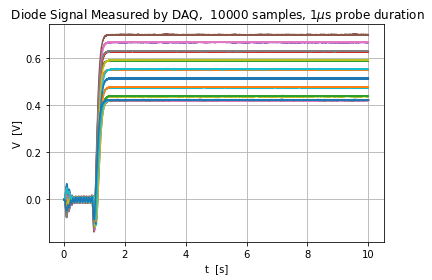

In [68]:
location_steps = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\1micro\Sweeping steps'
location = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\1micro'

fig,ax= plt.subplots()
ax.grid(True)
for i in range(0,len(Diode_Signal_1micro)):
    plt.plot(Diode_Signal_1micro[i][1],Diode_Signal_1micro[i][0],label= 'Step {st}'.format(st = i ))

ax.set_ylabel(r'V  [V]')
ax.set_xlabel('t  [s]')
ax.set_title(r' Diode Signal Measured by DAQ,  {b} samples, 1$\mu$s probe duration'.format(b = len(Diode_Signal_1micro[0][1]) ))
#ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
#ax.legend(loc=0)
plt.show()
fig.savefig(r'{loc}\Diode Signal time cstant = 30ms sensitivity 500microV,10seconds, 5ms scheme, probe duration 1 micros,31 steps, no legend .jpeg'.format(loc = location),bbox_inches='tight')

In [74]:
for i in range(0,len(Diode_Signal_1micro)):
    np.savetxt(r'{loc}\diode_signal_step{stp}_10sdaqtime_5ms_tc30ms.csv'.format(loc = location_steps ,stp = i), Diode_Signal_1micro[i][0], delimiter=',') 

chopped_measurement_data = np.zeros((len(Diode_Signal_1micro)),  dtype=object)
for i in range(0,len(Diode_Signal_1micro)):
    chopped_measurement_data[i] = Diode_Signal_1micro[i][0][2000:] 

avr_1micro = np.array([np.average(i) for i in chopped_measurement_data])
np.savetxt(r'{loc}\averaged signal_31steps_10sdaqtime_tc30ms.csv'.format(loc =location),avr_1micro,delimiter=',')

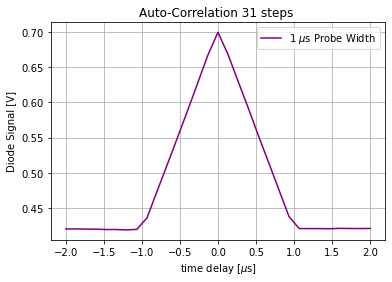

In [75]:
#change this to V regime
time_delay = np.linspace(-2,2,31)

fig,axes = plt.subplots()

axes.grid(True)

plt.plot(time_delay,avr_1micro,label=r'1 $\mu$s Probe Width ',color='purple')

axes.set_xlabel(r'time delay [$\mu$s]')
axes.set_ylabel(r'Diode Signal [V]')
axes.set_title('Auto-Correlation 31 steps ')

axes.legend(loc = 0)
plt.show()

fig.savefig(r'{loc}\Autocorrelation function 31 steps, tc =30ms , sensitivity =5500mV  ,1microsprobe.jpeg'.format(loc = location),bbox_inches='tight')

In [84]:
M8190A.write('SEQ:DEL:ALL')

12

# 100 nano

In [72]:
sweeping_run_100nano_a = pickle.load(open(r"{dict}\cycleA_31steps_5ms_100nano_probe.p".format(dict = r'D:\Alejandro\Pulses\diode measurements\TList\100nano'), "rb"))
sweeping_run_100nano_b = pickle.load(open("sweepingB_30steps_5ms_10micro_probe.p", "rb"))

<ipython-input-72-20c2759c5dc7>:1: ResourceWarning: unclosed file <_io.BufferedReader name='D:\\Alejandro\\Pulses\\diode measurements\\TList\\100nano\\cycleA_31steps_5ms_100nano_probe.p'>
  sweeping_run_100nano_a = pickle.load(open(r"{dict}\cycleA_31steps_5ms_100nano_probe.p".format(dict = r'D:\Alejandro\Pulses\diode measurements\TList\100nano'), "rb"))
<ipython-input-72-20c2759c5dc7>:2: ResourceWarning: unclosed file <_io.BufferedReader name='sweepingB_30steps_5ms_10micro_probe.p'>
  sweeping_run_100nano_b = pickle.load(open("sweepingB_30steps_5ms_10micro_probe.p", "rb"))


In [73]:
Diode_Signal_100nano = Sequence_Loader_File_DAQ_np(M8190A,DAQ_Settings1,1000,20,sweeping_run_100nano_a,sweeping_run_100nano_b)

Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 0
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 1
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 2
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 3
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 4
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse 

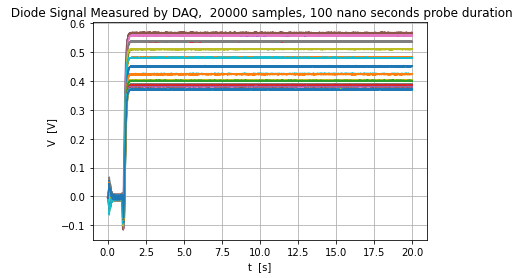

In [76]:
location_steps = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\100nano\Sweeping steps'
location = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\100nano'

fig,ax= plt.subplots()
ax.grid(True)
for i in range(0,len(Diode_Signal_100nano)):
    plt.plot(Diode_Signal_100nano[i][1],Diode_Signal_100nano[i][0],label= 'Step {st}'.format(st = i ))

ax.set_ylabel(r'V  [V]')
ax.set_xlabel('t  [s]')
ax.set_title(r' Diode Signal Measured by DAQ,  {b} samples, 100 nano seconds probe duration'.format(b = len(Diode_Signal_100nano[0][1]) ))
#ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
#ax.legend(loc=0)
plt.show()
fig.savefig(r'{loc}\Diode Signal time cstant = 30ms sensitivity 500microV,20seconds, 5ms scheme, probe duration 1 nanos,31 steps, no legend .jpeg'.format(loc = location),bbox_inches='tight')

In [77]:
for i in range(0,len(Diode_Signal_100nano)):
    np.savetxt(r'{loc}\diode_signal_step{stp}_20sdaqtime_5ms_tc30ms.csv'.format(loc = location_steps ,stp = i), Diode_Signal_100nano[i][0], delimiter=',') 

chopped_measurement_data = np.zeros((len(Diode_Signal_100nano)),  dtype=object)
for i in range(0,len(Diode_Signal_100nano)):
    chopped_measurement_data[i] = Diode_Signal_100nano[i][0][3500:] 

avr_100nano = np.array([np.average(i) for i in chopped_measurement_data])
np.savetxt(r'{loc}\averaged signal_31steps_20sdaqtime_tc30ms.csv'.format(loc =location),avr_100nano,delimiter=',')

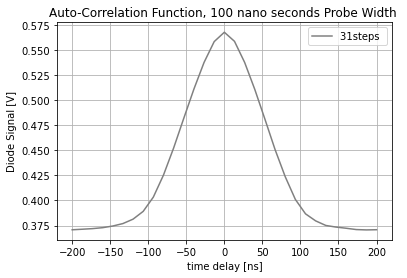

In [83]:
#change this to V regime
time_delay = np.linspace(-200,200,31)

fig,axes = plt.subplots()

axes.grid(True)

plt.plot(time_delay,avr_100nano,label=r'31steps ',color='grey')

axes.set_xlabel(r'time delay [ns]')
axes.set_ylabel(r'Diode Signal [V]')
axes.set_title('Auto-Correlation Function, 100 nano seconds Probe Width ')

axes.legend(loc = 1)
plt.show()

fig.savefig(r'{loc}\Autocorrelation function 31 steps, tc = 30ms, sensitivity = 500mV ,100nanosprobe.jpeg'.format(loc = location),bbox_inches='tight')

# 10nano

In [ ]:
sweeping_run_10nano_a = pickle.load(open(r"{dict}\cycleA_31steps_5ms_10nano_probe.p".format(dict = r'D:\Alejandro\Pulses\diode measurements\TList\10nano'), "rb"))
sweeping_run_10nano_b = pickle.load(open("sweepingB_30steps_5ms_10micro_probe.p", "rb"))

In [73]:
DAQ_time = 10
tc = '30ms'
sns = '100 micro'

Diode_Signal_10nano = Sequence_Loader_File_DAQ_np(M8190A,DAQ_Settings1,1000,DAQ_time,sweeping_run_10nano_a,sweeping_run_10nano_b)

Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 0
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 1
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 2
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 3
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse Stoped
Data acquired for Step 4
Sequence loaded with the following segment data "1,1,0,1,0,29999999,2,1,0,1,0,29999999" and the advancement method is COND
Triggering Pulse 

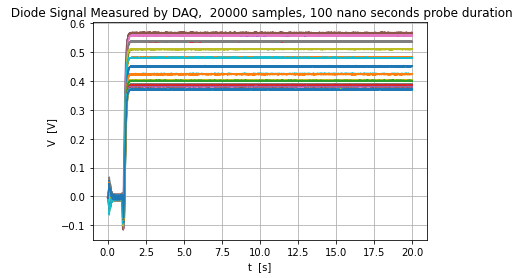

In [76]:
location_steps = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\100nano\Sweeping steps'
location = r'D:\Alejandro\Pulses\All Diode Measurements Notebook\100nano'

fig,ax= plt.subplots()
ax.grid(True)
for i in range(0,len(Diode_Signal_10nano)):
    plt.plot(Diode_Signal_100nano[i][1],Diode_Signal_10nano[i][0],label= 'Step {st}'.format(st = i ))

ax.set_ylabel(r'V  [V]')
ax.set_xlabel('t  [s]')
ax.set_title(r' Diode Signal Measured by DAQ, 31 steps with {b} samples, 10ns probe duration'.format(b = len(Diode_Signal_10nano[0][1]) ))
#ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
#ax.legend(loc=0)
plt.show()
fig.savefig(r'{loc}\Diode Signal time cstant = 30ms sensitivity 100microV,{f}s daqtime, 5ms scheme, probe duration 10nano,31 steps,60kreps .jpeg'.format(loc = location, f = DAQ_time),bbox_inches='tight')

In [77]:
for i in range(0,len(Diode_Signal_10nano)):
    np.savetxt(r'{loc}\diode_signal_step{stp}_{f}sdaqtime_5ms_30tc_100microV_60kreps.csv'.format(loc = location ,stp = i, f = DAQ_time), Diode_Signal_10nano[i][0], delimiter=',') 

chopped_measurement_data = np.zeros((len(Diode_Signal_10nano)),  dtype=object)
for i in range(0,len(Diode_Signal_10nano)):
    chopped_measurement_data[i] = Diode_Signal_10nano[i][0][3500:] 

avr_10nano = np.array([np.average(i) for i in chopped_measurement_data])
np.savetxt(r'{loc}\averaged signal_31steps_{f}sdaqtime_5ms_30tc_100microV_60kreps.csv'.format(loc =location, f = DAQ_time),avr_10nano,delimiter=',')

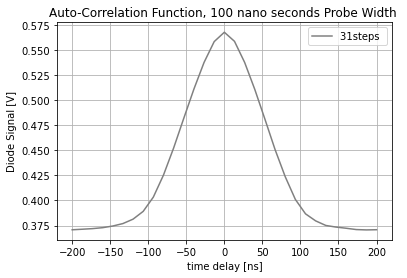

In [83]:
#change this to V regime
time_delay = np.linspace(-200,200,31)

fig,axes = plt.subplots()

axes.grid(True)

plt.plot(time_delay,avr_10nano,label=r'31steps ',color='grey')

axes.set_xlabel(r'time delay [ns]')
axes.set_ylabel(r'Diode Signal [V]')
axes.set_title('Auto-Correlation Function, 100 nano seconds Probe Width ')

axes.legend(loc = 1)
plt.show()

fig.savefig(r'{loc}\Autocorrelation function 31 steps 10nano probe, tc = 30ms,sens =100microV,{f}sdaqtime, 60kreps.jpeg'.format(loc = location, f = DAQ_time),bbox_inches='tight')

# 1 nano

In [ ]:
#sweeping_run_1nano_a = pickle.load(open(r"{dict}\cycleA_31steps_5ms_100nano_probe.p".format(dict = r'D:\Alejandro\Pulses\diode measurements\TList\1nano'), "rb"))
#sweeping_run_1nano_b = pickle.load(open("sweepingB_30steps_5ms_10micro_probe.p", "rb"))

In [ ]:
# load array
avrg_1ms = loadtxt('averaged signal_30steps_onepoint5.csv',delimiter= ",")
avrg_100micro = loadtxt('averaged signal_30steps_point1.csv',delimiter = ',')
avrg_10micro = loadtxt('averaged signal_30steps_10micro.csv', delimiter= ',')
avrg_1micro = loadtxt('averaged signal_30steps_35seconds.csv', delimiter=',')
avrg_100ns = loadtxt('averaged signal_30steps_35seconds_pointfive.csv', delimiter=',')
avrg_10ns =  loadtxt('averaged signal_30steps_35seconds_pointfive.csv', delimiter=',')
avrg_1ns = loadtxt('averaged signal_30steps_35seconds_pointfive.csv', delimiter=',')

# print the array